# EJercicio 3: Predicción de consumo excesivo de agua en mazanas de la CDMX

De acuerdo con los datos públicos de consumo de agua de la Ciudad de México, predice si una manzana (unidad geográfica censal) presentará un consumo excesivo de agua en un próximo periodo bimestral. 

**Dataset:** [Portal de Datos abierto de la CDMX](https://datos.cdmx.gob.mx/ne/dataset/consumo-agua)

**Propuestas de Modelos:** Random Forest, Árbol de decisión o Regresión logística.

## 1. Carga y exploración general de los datos

Importaremos los datos y realizaremos un análisis inicial de las variables: tipos, valores nulos y estadísticas básicas.

In [136]:
# Importar librerías necesarias
import polars as pl 
import numpy as np 
import pandas as pd

In [137]:

# Cargar el dataset
#Pandas carga correctamente el dataset, usando df= pd.read_csv('consumo_agua_historico_2019.csv') 
# Sin embargo Polars no lo hace a menos que se ignore los errores de lectura
df = pl.read_csv('consumo_agua_historico_2019.csv', ignore_errors=True)

# Mostrar las primeras filas psra exploración inicial
df.head()

fecha_referencia,anio,bimestre,consumo_total_mixto,consumo_prom_dom,consumo_total_dom,consumo_prom_mixto,consumo_total,consumo_prom,consumo_prom_no_dom,consumo_total_no_dom,indice_des,colonia,alcaldia,latitud,longitud
str,i64,i64,f64,f64,f64,f64,f64,f64,f64,f64,str,str,str,f64,f64
"""2019-06-30""",2019,3,159.72,42.566364,468.23,53.24,631.0,42.066667,3.05,3.05,"""ALTO""","""7 DE NOVIEMBRE""","""GUSTAVO A. MADERO""",19.45526,-99.112662
"""2019-06-30""",2019,3,0.0,35.936667,107.81,0.0,115.13,28.7825,7.32,7.32,"""MEDIO""","""7 DE NOVIEMBRE""","""GUSTAVO A. MADERO""",19.45526,-99.112662
"""2019-06-30""",2019,3,0.0,24.586,122.93,0.0,197.96,32.993333,75.03,75.03,"""POPULAR""","""7 DE NOVIEMBRE""","""GUSTAVO A. MADERO""",19.45572,-99.113582
"""2019-06-30""",2019,3,0.0,0.0,0.0,0.0,253.53,84.51,84.51,253.53,"""BAJO""","""GERTRUDIS SANCHEZ 3A SECCION""","""GUSTAVO A. MADERO""",19.459647,-99.104469
"""2019-06-30""",2019,3,56.72,67.43625,539.49,56.72,839.35,76.304545,121.57,243.14,"""BAJO""","""PRO HOGAR I""","""AZCAPOTZALCO""",19.474161,-99.14675


In [138]:
#Para un mejor analisis de lo que sucede con el dataset, usamos la estructura try-except
# El error encontrado durante la lectura del archivo la guardamos en la variable e
try:
    df = pl.read_csv("consumo_agua_historico_2019.csv")
    print(df.head())
except Exception as e:
    print("Error:", e)


Error: could not parse `NA` as dtype `f64` at column 'consumo_total_mixto' (column number 4)

The current offset in the file is 151997 bytes.

You might want to try:
- increasing `infer_schema_length` (e.g. `infer_schema_length=10000`),
- specifying correct dtype with the `schema_overrides` argument
- setting `ignore_errors` to `True`,
- adding `NA` to the `null_values` list.

Original error: ```remaining bytes non-empty```


Encontramos el primer error cuando polars intenta leer el NA como un valor float64 que no puedd convertir automáticamente en número, así que agregamos "NA" como un valor nulo

In [139]:
df = pl.read_csv(
    "consumo_agua_historico_2019.csv",
    null_values=["NA"],  # <- esto le dice que 'NA' es un valor nulo
)
print(df.head())

shape: (5, 16)
┌────────────┬──────┬──────────┬────────────┬───┬────────────┬────────────┬───────────┬────────────┐
│ fecha_refe ┆ anio ┆ bimestre ┆ consumo_to ┆ … ┆ colonia    ┆ alcaldia   ┆ latitud   ┆ longitud   │
│ rencia     ┆ ---  ┆ ---      ┆ tal_mixto  ┆   ┆ ---        ┆ ---        ┆ ---       ┆ ---        │
│ ---        ┆ i64  ┆ i64      ┆ ---        ┆   ┆ str        ┆ str        ┆ f64       ┆ f64        │
│ str        ┆      ┆          ┆ f64        ┆   ┆            ┆            ┆           ┆            │
╞════════════╪══════╪══════════╪════════════╪═══╪════════════╪════════════╪═══════════╪════════════╡
│ 2019-06-30 ┆ 2019 ┆ 3        ┆ 159.72     ┆ … ┆ 7 DE       ┆ GUSTAVO A. ┆ 19.45526  ┆ -99.112662 │
│            ┆      ┆          ┆            ┆   ┆ NOVIEMBRE  ┆ MADERO     ┆           ┆            │
│ 2019-06-30 ┆ 2019 ┆ 3        ┆ 0.0        ┆ … ┆ 7 DE       ┆ GUSTAVO A. ┆ 19.45526  ┆ -99.112662 │
│            ┆      ┆          ┆            ┆   ┆ NOVIEMBRE  ┆ MADERO     ┆ 

Ahora que ha cargado correctamente el dataset podemos hacer el análisis inicial del tipo de variables, valores nulos y estadistícas básicas

In [140]:
# Tipos de variables y valores nulos
print('Tipos de datos:')
print(df.dtypes)

print('\nValores nulos por columna:')
print(df.null_count())

# Estadísticas básicas
df.describe()



Tipos de datos:
[String, Int64, Int64, Float64, Float64, Float64, Float64, Float64, Float64, Float64, Float64, String, String, String, Float64, Float64]

Valores nulos por columna:
shape: (1, 16)
┌─────────────────┬──────┬──────────┬────────────────┬───┬─────────┬──────────┬─────────┬──────────┐
│ fecha_referenci ┆ anio ┆ bimestre ┆ consumo_total_ ┆ … ┆ colonia ┆ alcaldia ┆ latitud ┆ longitud │
│ a               ┆ ---  ┆ ---      ┆ mixto          ┆   ┆ ---     ┆ ---      ┆ ---     ┆ ---      │
│ ---             ┆ u32  ┆ u32      ┆ ---            ┆   ┆ u32     ┆ u32      ┆ u32     ┆ u32      │
│ u32             ┆      ┆          ┆ u32            ┆   ┆         ┆          ┆         ┆          │
╞═════════════════╪══════╪══════════╪════════════════╪═══╪═════════╪══════════╪═════════╪══════════╡
│ 0               ┆ 0    ┆ 0        ┆ 8327           ┆ … ┆ 216     ┆ 216      ┆ 0       ┆ 0        │
└─────────────────┴──────┴──────────┴────────────────┴───┴─────────┴──────────┴─────────┴────────

statistic,fecha_referencia,anio,bimestre,consumo_total_mixto,consumo_prom_dom,consumo_total_dom,consumo_prom_mixto,consumo_total,consumo_prom,consumo_prom_no_dom,consumo_total_no_dom,indice_des,colonia,alcaldia,latitud,longitud
str,str,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,str,str,str,f64,f64
"""count""","""71102""",71102.0,71102.0,62775.0,66282.0,66282.0,62775.0,71102.0,71102.0,71102.0,71102.0,"""71102""","""70886""","""70886""",71102.0,71102.0
"""null_count""","""0""",0.0,0.0,8327.0,4820.0,4820.0,8327.0,0.0,0.0,0.0,0.0,"""0""","""216""","""216""",0.0,0.0
"""mean""",null,2019.0,2.006807,174.359929,29.132386,1186.263611,50.636234,1695.847222,111.217399,126.760172,436.060309,null,null,null,19.392273,-99.132896
"""std""",null,0.0,0.814393,312.663596,64.565925,2771.038307,130.408673,3555.697457,1069.949262,1095.817805,2126.152162,null,null,null,0.070549,0.05789
"""min""","""2019-02-28""",2019.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,"""ALTO""","""10 DE ABRIL""","""ALVARO OBREGON""",19.135867,-99.337703
"""25%""",null,2019.0,1.0,0.0,18.690313,161.63,0.0,340.95,23.01,6.275,10.98,null,null,null,19.344073,-99.172484
"""50%""",null,2019.0,2.0,79.94,26.414286,604.23,33.451667,896.21,31.694,19.280001,54.07,null,null,null,19.39291,-99.135196
"""75%""",null,2019.0,3.0,233.33,36.246667,1261.45,61.221667,1808.94,45.485,54.19,230.44,null,null,null,19.446822,-99.09663
"""max""","""2019-06-30""",2019.0,3.0,23404.44,7796.41,95060.69,11702.22,119726.94,89691.773438,89691.773438,119726.94,"""POPULAR""","""ZOTOLTITLA""","""XOCHIMILCO""",19.579103,-98.950469


## 2. Limpieza básica

Observamos que en fecha de referencia no existen fechas faltantes, el periodo abarca entre finales de febrero y finales de junio de 2019, bimestre nos indica que en efecto son 3 los registrados (valores min 1, max 3), así como una desviación estandar de 0 en el año nos dice que no tenemos datos fuera de el.

Por otro lado en el consumo tenemos bastantes valores faltantes, en el consumo mixto faltan 8327 de 62775 valores, el 13.3%, como el objetivo de nuestro ejercicio es hacer una clasificación por características históricas y son pocos registros (3 bimestres) a los que tenemos acceso, no deberiamos imputar estos datos, la mejor opción en este caso será eliminarlos.

Para colonia y alcaldía faltan 216 de 71102 valores, el 0.3%.
Latitud y longitud si esta completo, no existen nulos, por lo que podríamos rellenar los valores de colonia y alcaldía si contamos con los datos de correlación correspondientes como un catálogo geográfico. Sin emabrgo en este caso los valores faltantes son pocos (0.3%) y optaremos por eliminar estos registros.

In [141]:
#Filtramos los datos para eliminar filas con valores nulos en columnas específicas en consumo y colonia
df = df.filter(df["consumo_total_mixto"].is_not_null() ) # Filtrar filas donde 'consumo_total' no es nulo
df = df.filter(df["consumo_total_dom"].is_not_null() ) 
df = df.filter(df["colonia"].is_not_null())

Revisamos que no tengamos mas valores nulos

In [142]:
#print(df.null_count())
df.null_count().to_dict(as_series=False)


{'fecha_referencia': [0],
 'anio': [0],
 'bimestre': [0],
 'consumo_total_mixto': [0],
 'consumo_prom_dom': [0],
 'consumo_total_dom': [0],
 'consumo_prom_mixto': [0],
 'consumo_total': [0],
 'consumo_prom': [0],
 'consumo_prom_no_dom': [0],
 'consumo_total_no_dom': [0],
 'indice_des': [0],
 'colonia': [0],
 'alcaldia': [0],
 'latitud': [0],
 'longitud': [0]}

In [143]:
#Eliminamos datos duplicados
df = df.unique()


## 3. Análisis exploratorio y visualización inicial

En este paso se realizará un análisis estadístico descriptivo y se crearán gráficos para identificar patrones o relaciones importantes en los datos.

In [144]:
import polars as pl
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
import numpy as np

In [135]:
num_alcaldias = df.select("alcaldia").n_unique()
print(f"Hay {num_alcaldias} alcaldías en el dataset.")


Hay 16 alcaldías en el dataset.


In [162]:
num_colonias = df.select("colonia").n_unique()
print(f"Hay {num_colonias} colonias en el dataset.")

Hay 1492 colonias en el dataset.


In [156]:
import matplotlib.pyplot as plt

print("Estadísticas de 'consumo_total' por alcaldía:")
agg_stats = df.group_by("alcaldia").agg([
    pl.len().alias("n_registros"),
    pl.mean("consumo_total").alias("media_consumo"),
    pl.std("consumo_total").alias("std_consumo"),
    pl.min("consumo_total").alias("min_consumo"),
    pl.median("consumo_total").alias("mediana_consumo"),
    pl.max("consumo_total").alias("max_consumo")
])

print(agg_stats.sort("media_consumo", descending=True))

Estadísticas de 'consumo_total' por alcaldía:
shape: (16, 7)
┌──────────────┬─────────────┬─────────────┬─────────────┬─────────────┬─────────────┬─────────────┐
│ alcaldia     ┆ n_registros ┆ media_consu ┆ std_consumo ┆ min_consumo ┆ mediana_con ┆ max_consumo │
│ ---          ┆ ---         ┆ mo          ┆ ---         ┆ ---         ┆ sumo        ┆ ---         │
│ str          ┆ u32         ┆ ---         ┆ f64         ┆ f64         ┆ ---         ┆ f64         │
│              ┆             ┆ f64         ┆             ┆             ┆ f64         ┆             │
╞══════════════╪═════════════╪═════════════╪═════════════╪═════════════╪═════════════╪═════════════╡
│ CUAJIMALPA   ┆ 717         ┆ 3184.448647 ┆ 6847.940429 ┆ 0.0         ┆ 1312.26     ┆ 66650.92    │
│ DE MORELOS   ┆             ┆             ┆             ┆             ┆             ┆             │
│ MIGUEL       ┆ 4286        ┆ 2837.646892 ┆ 4264.04373  ┆ 0.0         ┆ 1748.09     ┆ 65285.12    │
│ HIDALGO      ┆             ┆

In [169]:
colonias_con_3_bimestres = (
    df.group_by("colonia")
    .agg(pl.col("bimestre").n_unique().alias("bimestres_distintos"))
    .filter(pl.col("bimestres_distintos") == 3)
)

# Mostrar cuántas colonias cumplen
print(f"Colonias con datos en los 3 bimestres: {colonias_con_3_bimestres.height} de {num_colonias} colonías, es decir el {colonias_con_3_bimestres.height/num_colonias*100:.2f}%.")

Colonias con datos en los 3 bimestres: 1098 de 1492 colonías, es decir el 73.59%.


FIltremos nuevamente, ahora las colonias que tienen datos en los 3 bimestres y guardemos esto para los siguientes pasos y el entrenamiento 

In [172]:
#colonias_validas = colonias_con_3_bimestres["colonia"] #polars.series con las colonias válidas
df_3registros = df.join(colonias_con_3_bimestres, on="colonia", how="inner") 

In [173]:
print(f"Hay {df_3registros.select("colonia").n_unique()} colonias en el dataset.")

Hay 1098 colonias en el dataset.


Revisemos el consumo total por manzana (colonia registrada), si es común que el rango registrado sea bajo o sea alto

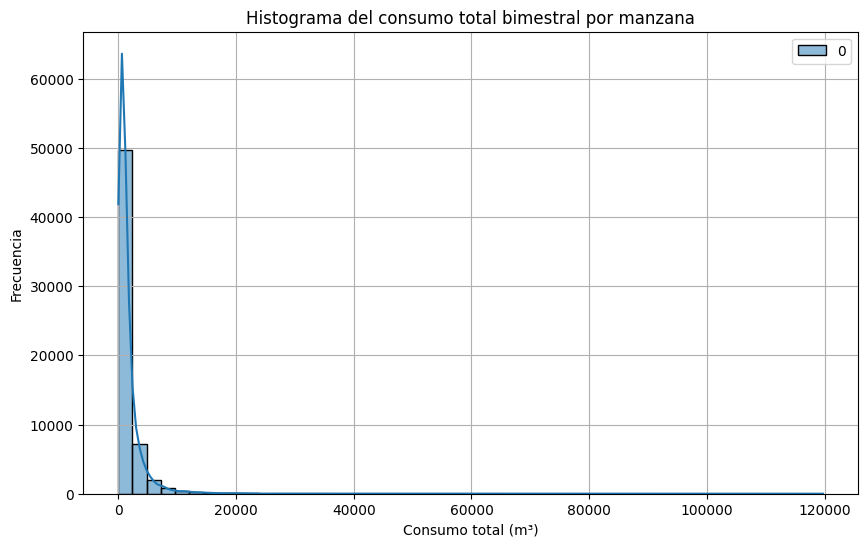

In [145]:
df_numpy =df.select("consumo_total").to_numpy()
plt.figure(figsize=(10, 6))
sns.histplot(df_numpy, bins=50, kde=True)
plt.title("Histograma del consumo total bimestral por manzana")
plt.xlabel("Consumo total (m³)")
plt.ylabel("Frecuencia")
plt.grid(True)
plt.show()


Revisemos si las zonas con mas consumo de agua se encuentran segregadas o dispersas, por medio de un mapa de calor interactivo, superponemos todos los bimestres y usamos el consumo total como distintivo de color y tamaño

In [146]:

import plotly.express as px
import polars as pl


# Asegúrate de que los datos tengan coordenadas y consumo válido
df_clean = df.filter(
    pl.col("latitud").is_not_null() &
    pl.col("longitud").is_not_null() &
    pl.col("consumo_total").is_not_null()
)

# Si es necesario, conviértelo a pandas para usar plotly
df_plot = df_clean.to_pandas()

# Crea el mapa de calor por el consumo de agua por manzana
fig = px.scatter_map(
    df_plot,
    lat="latitud",
    lon="longitud",
    color="consumo_total",             # Color según el consumo
    size="consumo_total",              # Tamaño proporcional al consumo
    size_max=15,
    color_continuous_scale=px.colors.sequential.Bluyl,   # Escala de colores
    hover_name="colonia",
    hover_data=["alcaldia", "anio", "bimestre", "consumo_prom"],
    zoom=10,
    height=600,
    title="Mapa de calor de consumo de agua por manzana - CDMX"
)

fig.show()


In [ ]:
print("Número de registros por alcaldía:")
df.group_by("alcaldia").count().sort("count", descending=True)


/tmp/ipykernel_96076/3764357995.py:1: DeprecationWarning:

`GroupBy.count` is deprecated. It has been renamed to `len`.



alcaldia,count
str,u32
"""GUSTAVO A. MADERO""",8777
"""IZTAPALAPA""",8543
"""CUAUHTEMOC""",6092
"""BENITO JUAREZ""",5496
"""VENUSTIANO CARRANZA""",4808
…,…
"""XOCHIMILCO""",2213
"""TLAHUAC""",1583
"""LA MAGDALENA CONTRERAS""",754


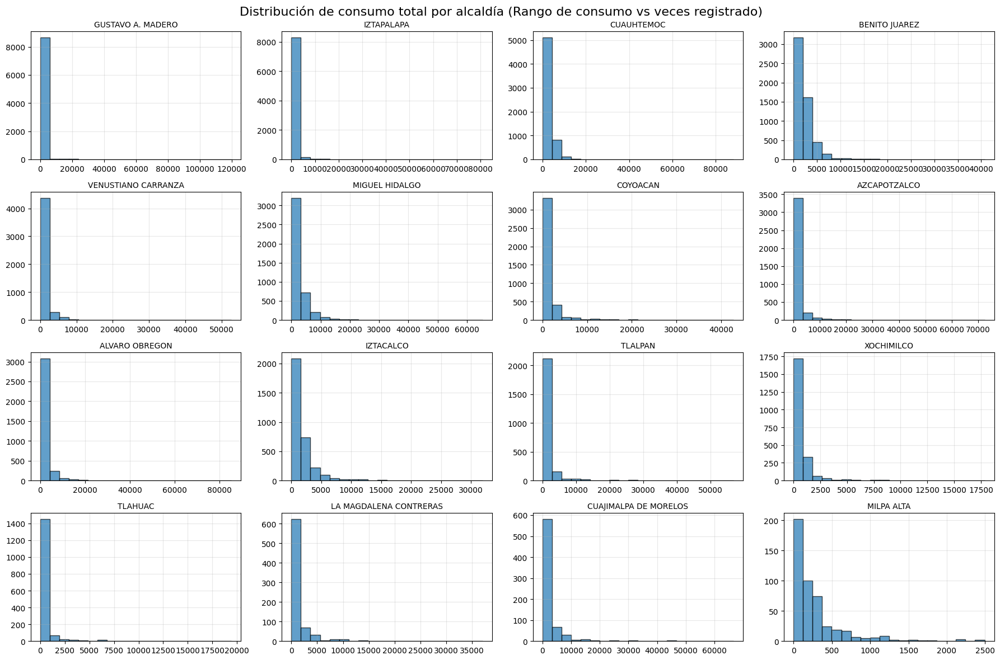

In [154]:


# 4. Visualización: Histograma de consumo por alcaldía
#alcaldias = df.select("alcaldia").unique().to_series().to_list()
conteo = (df.select("alcaldia").to_pandas()["alcaldia"].value_counts().sort_values(ascending=False))
alcaldias_ordenadas = conteo.index.tolist()

fig, axes = plt.subplots(nrows=4, ncols=4, figsize=(18, 12))
axes = axes.flatten()

for i, alcaldia in enumerate(alcaldias_ordenadas[:len(axes)]):  # Limita a las alcaldías
    consumo = df.filter(df["alcaldia"] == alcaldia).select("consumo_total").to_numpy().flatten()
    
    axes[i].hist(consumo, bins=20, edgecolor="black", alpha=0.7)
    axes[i].set_title(f"{alcaldia}", fontsize=10)
    axes[i].grid(True, alpha=0.3)

plt.suptitle("Distribución de consumo total por alcaldía (Rango de consumo vs veces registrado)", fontsize=16)
plt.tight_layout()
plt.show()

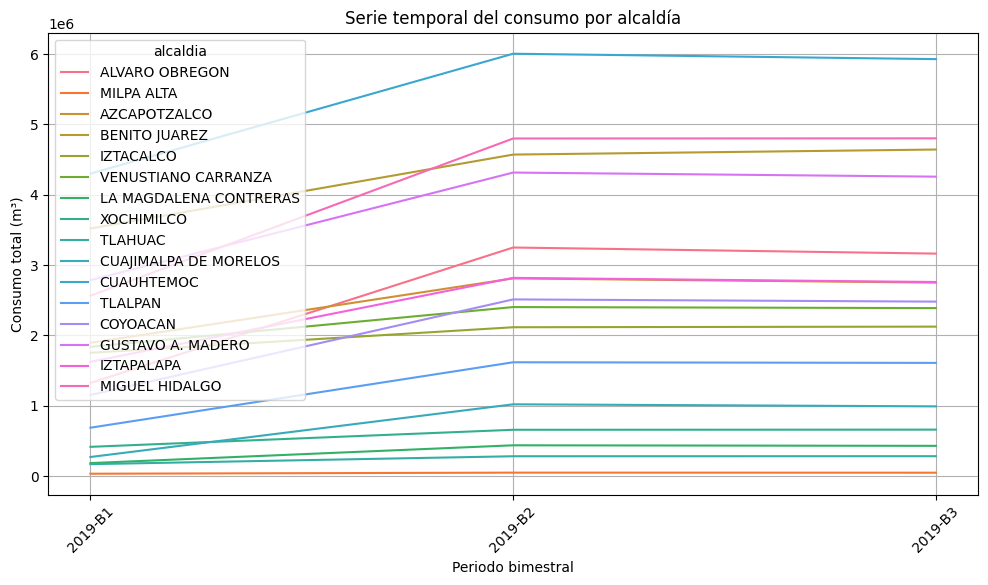

In [148]:
df_grouped = (
    df.group_by(["anio", "bimestre", "alcaldia"])
    .agg([
        pl.sum("consumo_total").alias("consumo_total_alcaldia")
    ])
    .sort(["anio", "bimestre"])
)

# Convertir a pandas para graficar con seaborn
df_grouped_pd = df_grouped.to_pandas()
df_grouped_pd["periodo"] = df_grouped_pd["anio"].astype(str) + "-B" + df_grouped_pd["bimestre"].astype(str)

plt.figure(figsize=(12, 6))
sns.lineplot(data=df_grouped_pd, x="periodo", y="consumo_total_alcaldia", hue="alcaldia")
plt.xticks(rotation=45)
plt.title("Serie temporal del consumo por alcaldía")
plt.xlabel("Periodo bimestral")
plt.ylabel("Consumo total (m³)")
plt.grid(True)
plt.show()


Graficamos la evolución temporal del consumo total para las 10 colonias con mayor consumo en el primer bimestre

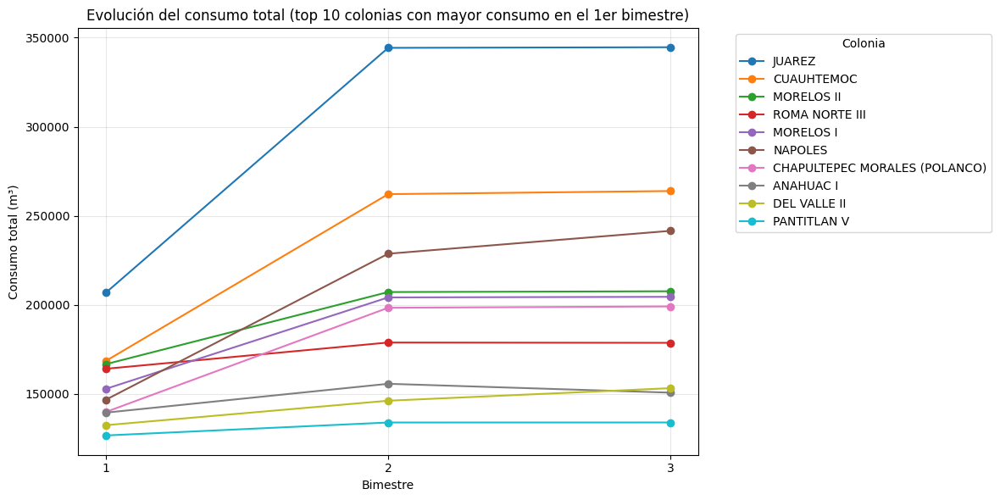

In [155]:
# Paso 1: Filtrar los primeros 3 bimestres
df_bimestres = df.filter(pl.col("bimestre").is_in([1, 2, 3]))

# Paso 2: Obtener consumo total por colonia y bimestre
df_sum = (
    df_bimestres.group_by(["colonia", "bimestre"])
    .agg([
        pl.sum("consumo_total").alias("consumo_total")
    ])
    .sort(["colonia", "bimestre"])
)

# Paso 3: Identificar las 10 colonias con mayor consumo en el primer bimestre
top10_colonias = (
    df_sum.filter(pl.col("bimestre") == 1)
    .sort("consumo_total", descending=True)
    .select("colonia")
    .to_series()
    .to_list()[:10]
)

# Paso 4: Filtrar solo esas colonias
df_top10 = df_sum.filter(pl.col("colonia").is_in(top10_colonias))

# Paso 5: Convertir a pandas para graficar
df_pandas_top10 = df_top10.to_pandas()

# Paso 6: Graficar
plt.figure(figsize=(12, 6))
for colonia in top10_colonias:
    datos = df_pandas_top10[df_pandas_top10["colonia"] == colonia]
    plt.plot(datos["bimestre"], datos["consumo_total"], marker="o", label=colonia)

plt.title("Evolución del consumo total (top 10 colonias con mayor consumo en el 1er bimestre)")
plt.xlabel("Bimestre")
plt.ylabel("Consumo total (m³)")
plt.xticks([1, 2, 3])
plt.grid(True, alpha=0.3)
plt.legend(title="Colonia", bbox_to_anchor=(1.05, 1), loc="upper left")
plt.tight_layout()
plt.show()


## 4. Preprocesamiento técnico (normalización, codificación, escalado, etc)

En este paso se prepararán los datos para el modelo de machine learning usando técnicas de normalización y escalado con scikit-learn.

Crearemos una variable objetivo que sea consderado un consumo excesivo, por ejemplo, mayor al 90% del consumo máximo de cada colonia 


In [ ]:
umbral = df_3registros.select(pl.col("consumo_total").quantile(0.9)).item()
df_3registros = df_3registros.with_columns([(pl.col("consumo_total") > umbral).alias("consumo_excesivo")]) #Esta es una columna binaria que indica si el consumo es excesivo o no



In [202]:
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.model_selection import train_test_split
import numpy as np

# Variables sin fuga
features_cat = ["alcaldia", "colonia"]
features_num = ["bimestre", "anio"]  

# Obtener arrays desde Polars
X_cat = df_3registros.select(features_cat).to_numpy()
X_num = df_3registros.select(features_num).to_numpy()
y = df_3registros.select("consumo_excesivo").to_numpy().flatten()

# OneHot encoding
encoder = OneHotEncoder(sparse_output=False, handle_unknown="ignore")
X_cat_enc = encoder.fit_transform(X_cat)

# Escalado de numéricos
scaler = StandardScaler()
X_num_scaled = scaler.fit_transform(X_num)

# Concatenar features
X_final = np.hstack([X_num_scaled, X_cat_enc])

# Separar train/test
X_train, X_test, y_train, y_test = train_test_split(
    X_final, y, test_size=0.2, random_state=42, stratify=y
)


In [203]:
print(f"Forma de X: {X_final.shape}")
print(f"Forma de y: {y.shape}")
print(f"Distribución de clases: {np.bincount(y.astype(int))}")

print(f"\nForma de datos de entrenamiento: {X_train_scaled.shape}")
print(f"Forma de datos de prueba: {X_test_scaled.shape}")

Forma de X: (56275, 1116)
Forma de y: (56275,)
Distribución de clases: [50648  5627]

Forma de datos de entrenamiento: (45020, 22)
Forma de datos de prueba: (11255, 22)


## 5. Entrenamiento de modelos de Machine Learning y 6. Evaluación detallada del modelo

RandomForest

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
# Entrenar modelo
rf = RandomForestClassifier(class_weight="balanced", random_state=42) #Damos un peso balanceado a las clases pues tenemos mas datos de consumo normal que excesivo
rf.fit(X_train, y_train)

# Predicciones
y_pred = rf.predict(X_test)

# Métricas clave
print("Accuracy:", accuracy_score(y_test, y_pred))
print("\nClassification Report:")
print(classification_report(y_test, y_pred))

print("\nConfusion Matrix:")
print(confusion_matrix(y_test, y_pred))

Accuracy: 0.7579742336739227

Classification Report:
              precision    recall  f1-score   support

       False       0.96      0.77      0.85     10130
        True       0.25      0.69      0.36      1125

    accuracy                           0.76     11255
   macro avg       0.60      0.73      0.61     11255
weighted avg       0.89      0.76      0.80     11255


Confusion Matrix:
[[7751 2379]
 [ 345  780]]


## 7. Visuaclización de resultados y métricas

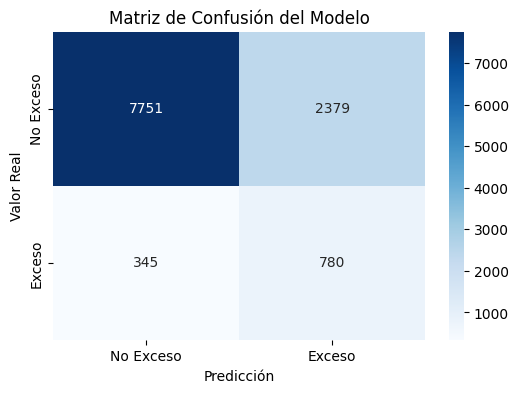

In [205]:
cm = confusion_matrix(y_test, y_pred)

plt.figure(figsize=(6,4))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=["No Exceso", "Exceso"], yticklabels=["No Exceso", "Exceso"])
plt.xlabel("Predicción")
plt.ylabel("Valor Real")
plt.title("Matriz de Confusión del Modelo")
plt.show()

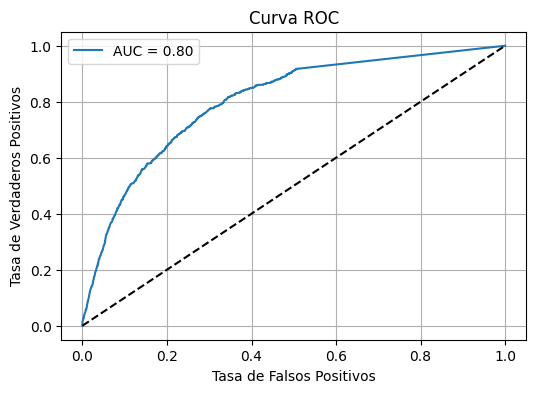

In [206]:
from sklearn.metrics import roc_curve, auc

y_probs = rf.predict_proba(X_test)[:, 1]  # Probabilidades clase 1

fpr, tpr, thresholds = roc_curve(y_test, y_probs)
roc_auc = auc(fpr, tpr)

plt.figure(figsize=(6,4))
plt.plot(fpr, tpr, label=f"AUC = {roc_auc:.2f}")
plt.plot([0, 1], [0, 1], "k--")
plt.xlabel("Tasa de Falsos Positivos")
plt.ylabel("Tasa de Verdaderos Positivos")
plt.title("Curva ROC")
plt.legend()
plt.grid(True)
plt.show()

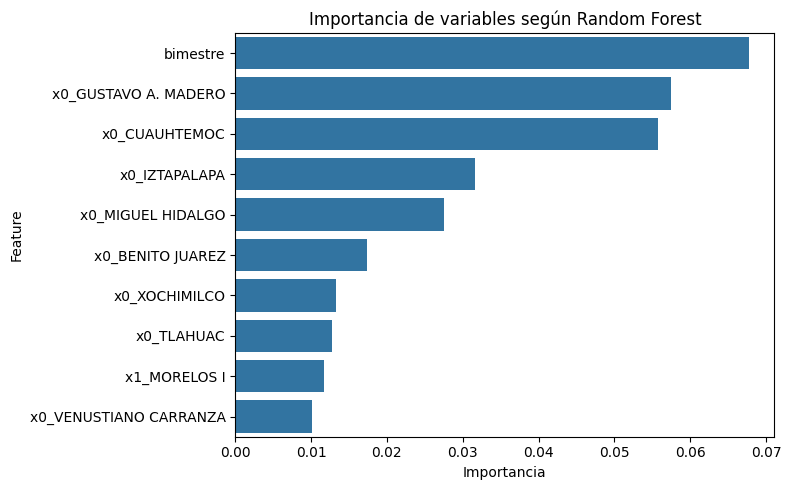

In [208]:
import pandas as pd
import numpy as np

feature_names = features_num + list(encoder.get_feature_names_out())
importances = rf.feature_importances_

importancia_df = pd.DataFrame({
    "Feature": feature_names,
    "Importancia": importances
}).sort_values(by="Importancia", ascending=False)

importancia_top = importancia_df.head(10)

plt.figure(figsize=(8, 5))
sns.barplot(x="Importancia", y="Feature", data=importancia_top)
plt.title("Importancia de variables según Random Forest")
plt.tight_layout()
plt.show()
